In [125]:
import pandas as pd
import matplotlib.pyplot as plt

In [126]:
import warnings
warnings.filterwarnings("ignore")

In [127]:
df = pd.read_csv("/content/dublinbikes_history_clean.csv")

In [128]:
df.shape

(7416360, 10)

In [129]:
df.isna().sum()

,0
station_id,0
name,0
num_bikes_available,0
num_docks_available,0
is_renting,0
is_returning,0
last_reported,0
capacity,0
lat,0
lon,0


In [130]:
df["last_reported"] = pd.to_datetime(df["last_reported"])
df["date"] = df["last_reported"].dt.date

In [131]:
# Sort properly
df = df.sort_values(["station_id", "last_reported"])

In [132]:
# Compute change in available bikes
df["delta_bikes"] = df.groupby("station_id")["num_bikes_available"].diff().abs()

In [133]:
df["delta_bikes"]

,delta_bikes
0,NaN
1,0.0
2,0.0
3,0.0
4,0.0
...,...
7416355,0.0
7416356,0.0
7416357,0.0
7416358,0.0


station_id

In [134]:
df["station_id"].nunique()

115

In [135]:
df["station_id"].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  47,  48,  49,  50,  51,  52,  53,
        54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,
        67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,
        80,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106,
       107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117])

In [136]:
df["delta_bikes"].nunique()

39

In [137]:
df["delta_bikes"].unique()

array([nan,  0.,  1.,  3.,  2.,  4., 15.,  5.,  7., 12.,  6., 16., 19.,
       14.,  9., 18., 10., 11.,  8., 17., 13., 21., 20., 22., 39., 27.,
       23., 24., 29., 26., 28., 30., 25., 37., 32., 33., 35., 38., 31.,
       34.])

In [138]:
df.columns

Index(['station_id', 'name', 'num_bikes_available', 'num_docks_available',
       'is_renting', 'is_returning', 'last_reported', 'capacity', 'lat', 'lon',
       'date', 'delta_bikes'],
      dtype='object')

### Daily activity

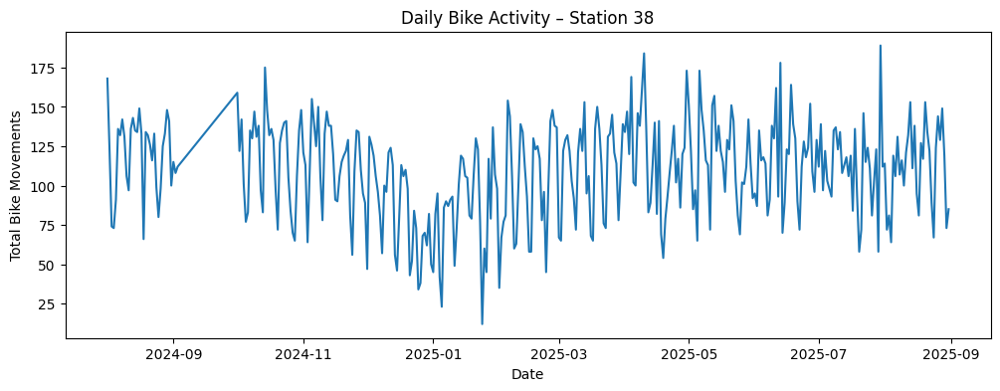

In [139]:
station_id =38
daily_activity = (
    df.groupby(["station_id", "date"])["delta_bikes"]
      .sum()
      .reset_index()
)

station_daily = daily_activity[
    daily_activity["station_id"] == station_id
]

plt.figure(figsize=(12, 4))
plt.plot(station_daily["date"], station_daily["delta_bikes"])
plt.xlabel("Date")
plt.ylabel("Total Bike Movements")
plt.title(f"Daily Bike Activity – Station {station_id}")
plt.show()

The above graph shows the Daily Activity of Talbort Street

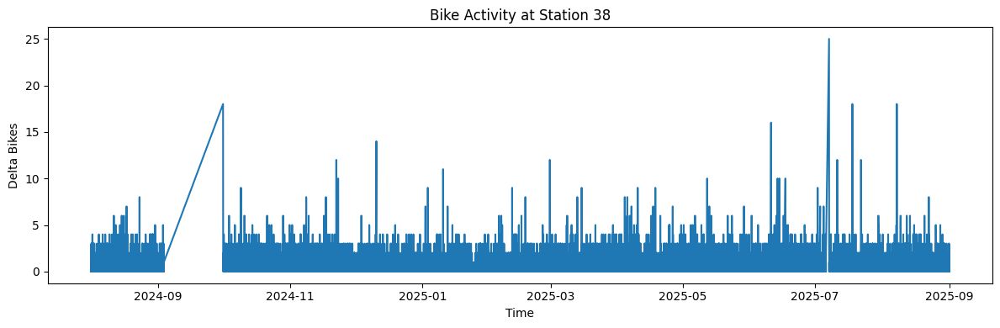

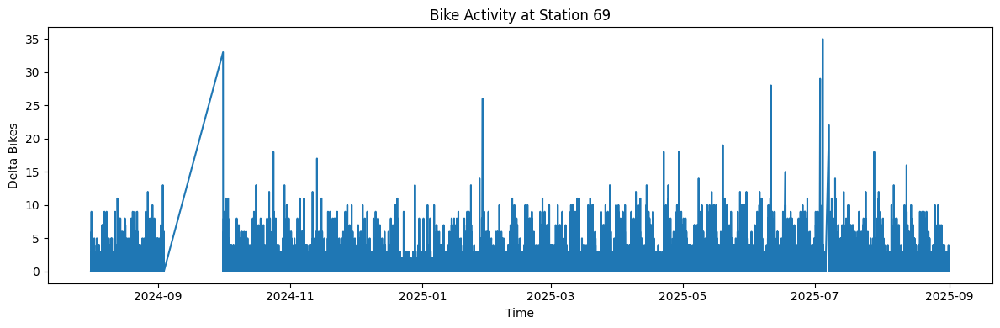

In [140]:
import matplotlib.pyplot as plt

station_ids = [38, 69]   # add more if needed

for station_id in station_ids:
    plot_df = (
        df[df["station_id"] == station_id]
        .sort_values("last_reported")
    )

    plt.figure(figsize=(12, 4))
    plt.plot(plot_df["last_reported"], plot_df["delta_bikes"])
    plt.xlabel("Time")
    plt.ylabel("Delta Bikes")
    plt.title(f"Bike Activity at Station {station_id}")
    plt.tight_layout()
    plt.show()


In [141]:
station_ids_list=(df["station_id"].unique())

In [142]:
station_ids_list

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  47,  48,  49,  50,  51,  52,  53,
        54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,
        67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,
        80,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106,
       107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117])

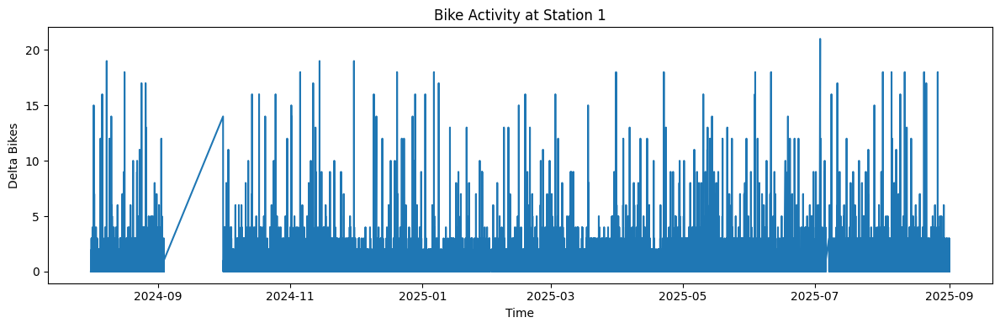

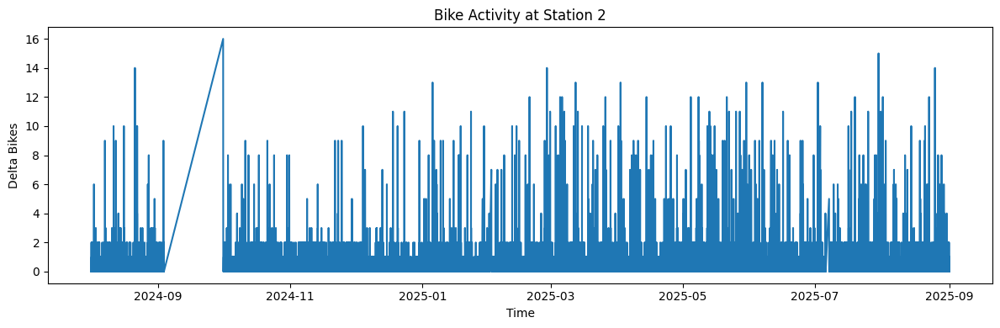

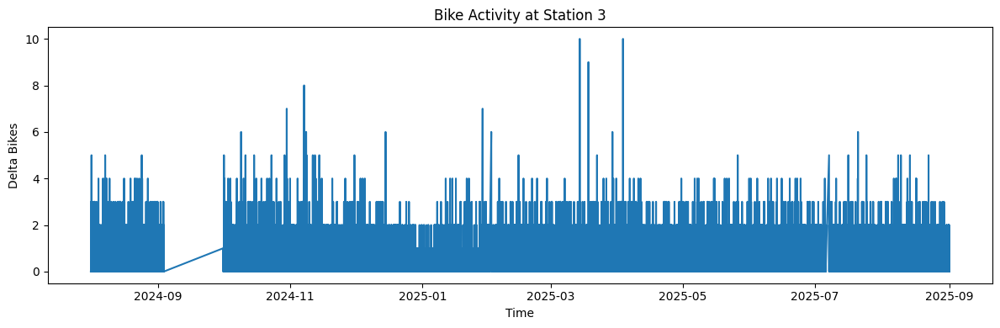

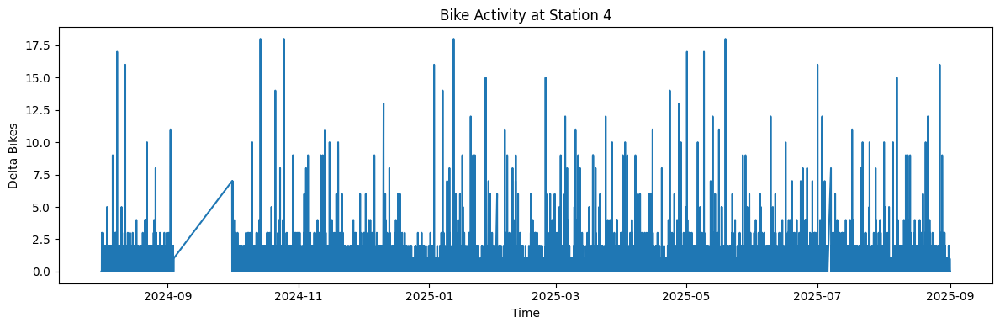

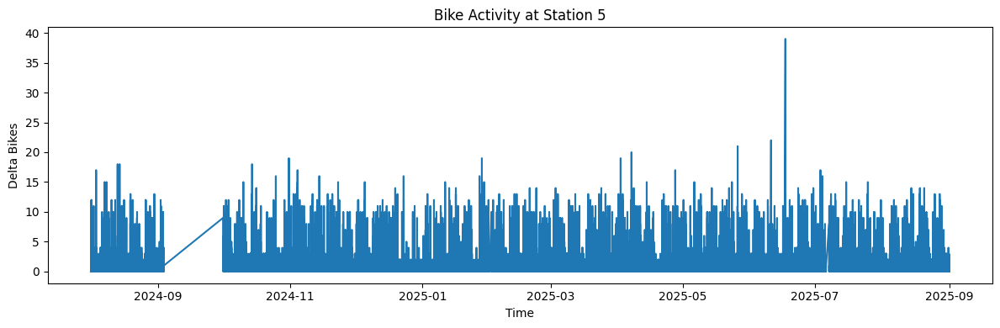

...

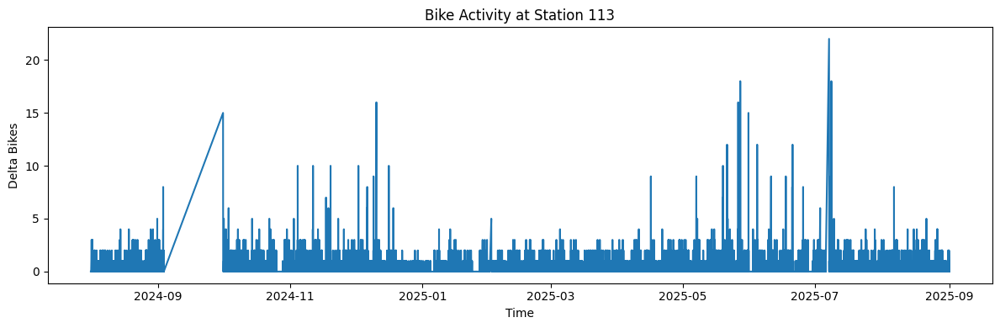

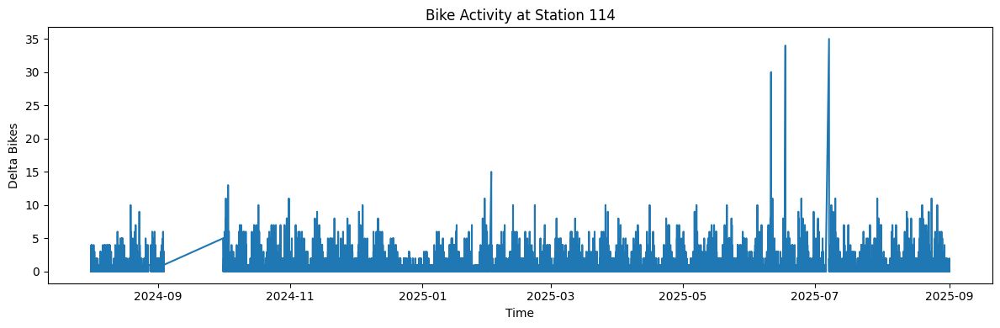

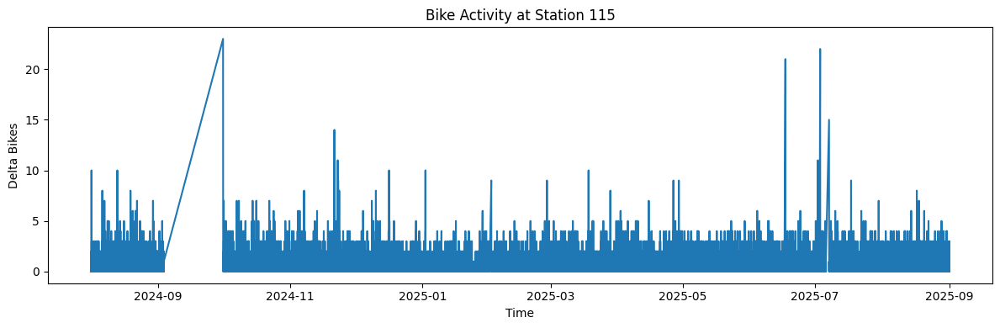

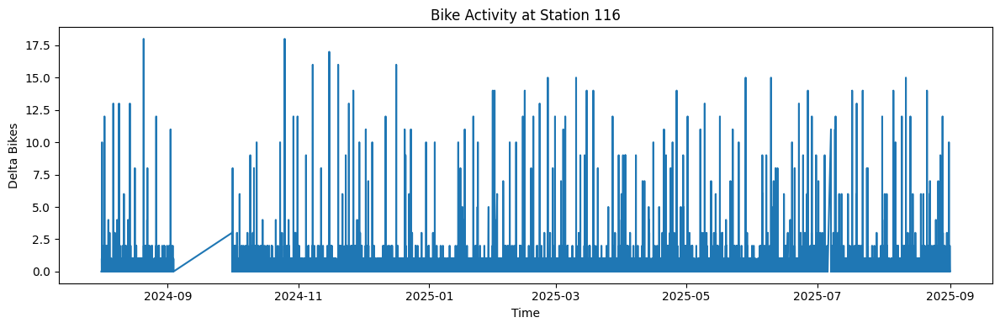

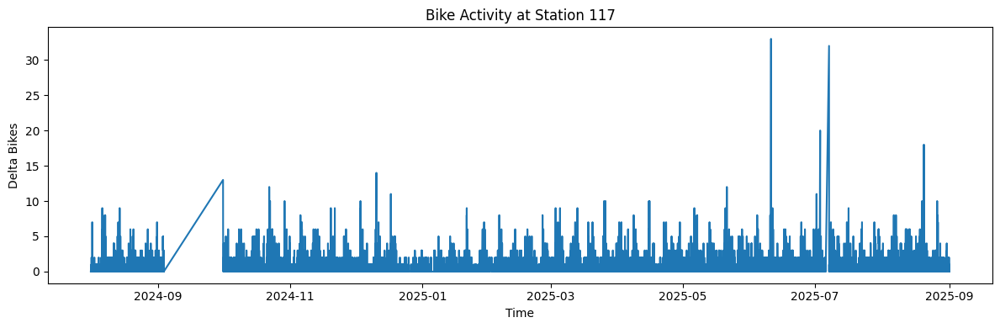

In [143]:
import matplotlib.pyplot as plt

station_ids = station_ids_list  # add more if needed

for station_id in station_ids:
    plot_df = (
        df[df["station_id"] == station_id]
        .sort_values("last_reported")
    )

    plt.figure(figsize=(12, 4))
    plt.plot(plot_df["last_reported"], plot_df["delta_bikes"])
    plt.xlabel("Time")
    plt.ylabel("Delta Bikes")
    plt.title(f"Bike Activity at Station {station_id}")
    plt.tight_layout()
    plt.show()


In [144]:
df["time"] = df["last_reported"].dt.time

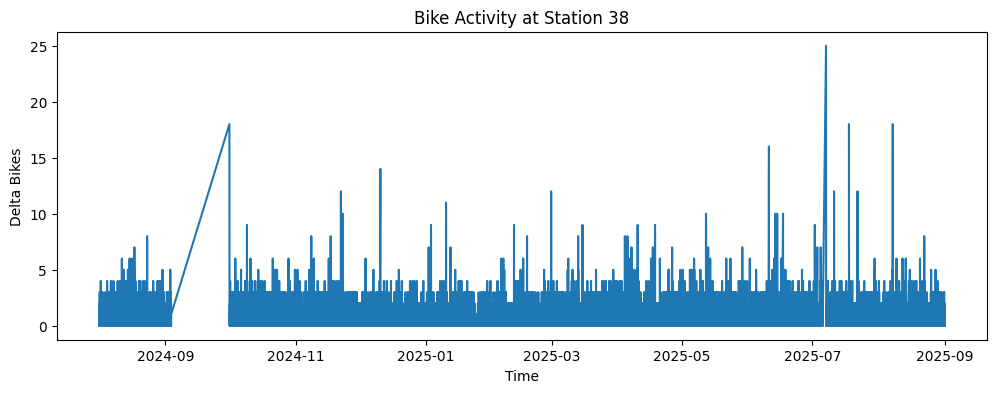

In [174]:
station_id = 38
plot_df = (
    df[df["station_id"] == station_id]
    .sort_values("last_reported")
)

plt.figure(figsize=(12, 4))
plt.plot(plot_df["last_reported"], plot_df["delta_bikes"])
plt.xlabel("Time")
plt.ylabel("Delta Bikes")
plt.title(f"Bike Activity at Station {station_id}")
plt.show()


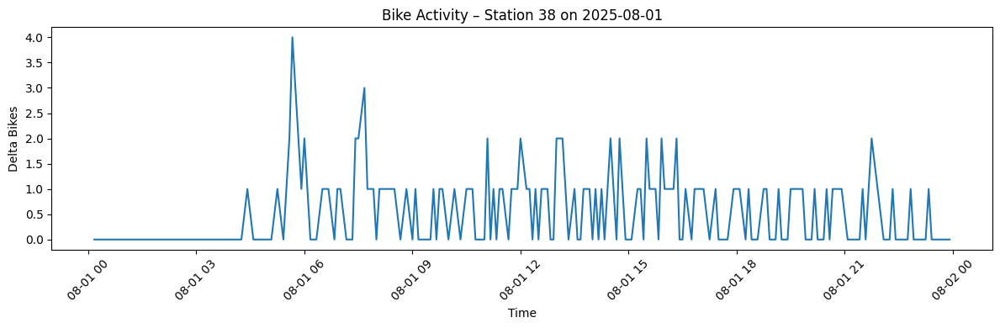

In [146]:
import matplotlib.pyplot as plt
import pandas as pd

station_id = 38
target_date = pd.to_datetime("2025-08-01").date()

# make sure last_reported is datetime
df["last_reported"] = pd.to_datetime(df["last_reported"])

# filter data
plot_df = (
    df[
        (df["station_id"] == station_id) &
        (df["last_reported"].dt.date == target_date)
    ]
    .sort_values("last_reported")
)

# plot
plt.figure(figsize=(12, 4))
plt.plot(plot_df["last_reported"], plot_df["delta_bikes"])
plt.xlabel("Time")
plt.ylabel("Delta Bikes")
plt.title(f"Bike Activity – Station {station_id} on {target_date}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


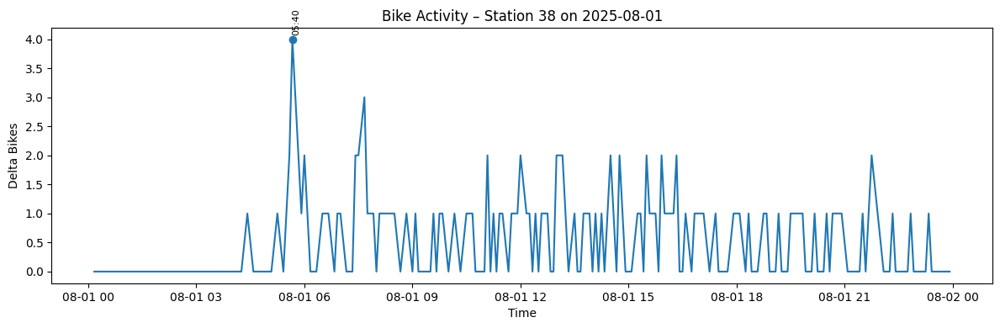

In [147]:
plt.figure(figsize=(12, 4))
plt.plot(plot_df["last_reported"], plot_df["delta_bikes"], label="Delta Bikes")

# highlight spikes
spikes = plot_df[plot_df["delta_bikes"] >= 4]
plt.scatter(
    spikes["last_reported"],
    spikes["delta_bikes"]
)

for _, row in spikes.iterrows():
    plt.text(
        row["last_reported"],
        row["delta_bikes"] + 0.1,
        row["last_reported"].strftime("%H:%M"),
        fontsize=8,
        rotation=90
    )

plt.xlabel("Time")
plt.ylabel("Delta Bikes")
plt.title(f"Bike Activity – Station {station_id} on {target_date}")
plt.tight_layout()
plt.show()


In [148]:
# Daily trips proxy
daily_trips = (
    df.groupby(["station_id", "date"])
      .agg(daily_trips=("delta_bikes", "sum"))
      .reset_index()
)

In [149]:
daily_trips.head()

,station_id,date,daily_trips
0,1,2024-08-01,131.0
1,1,2024-08-02,155.0
2,1,2024-08-03,95.0
3,1,2024-08-04,49.0
4,1,2024-08-05,81.0


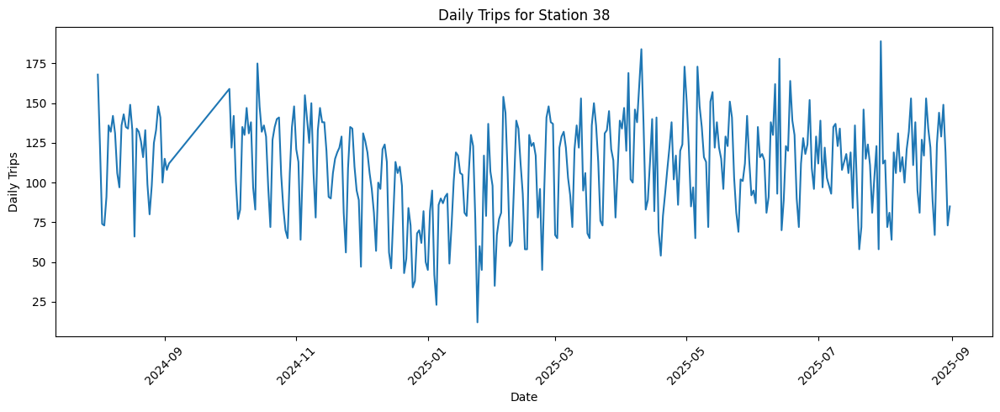

In [150]:
station_id = 38
plot_df = daily_trips[daily_trips["station_id"] == station_id]
plot_df = plot_df.sort_values("date")

plt.figure(figsize=(12, 5))
plt.plot(plot_df["date"], plot_df["daily_trips"])

plt.xlabel("Date")
plt.ylabel("Daily Trips")
plt.title(f"Daily Trips for Station {station_id}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


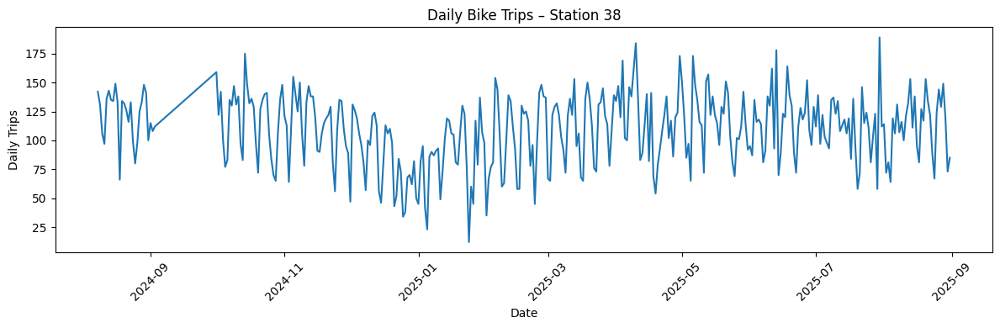

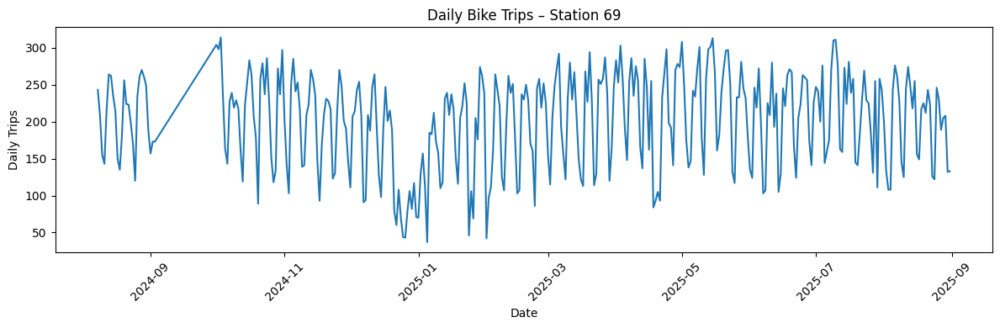

In [175]:

station_ids = [38, 69]

for station_id in station_ids:
    plot_df = (
        daily_trips[daily_trips["station_id"] == station_id]
        .sort_values("date")
    )

    plt.figure(figsize=(12, 4))
    plt.plot(plot_df["date"], plot_df["daily_trips"])
    plt.xlabel("Date")
    plt.ylabel("Daily Trips")
    plt.title(f"Daily Bike Trips – Station {station_id}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



Here in this graph we are comparing the Talbort Street and Grand Canal Dock

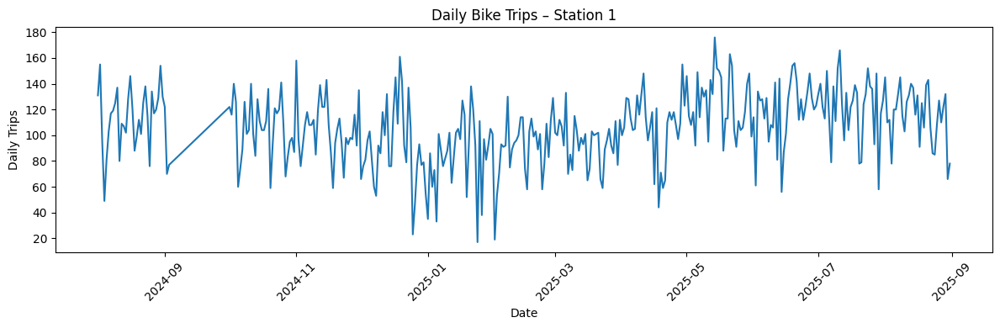

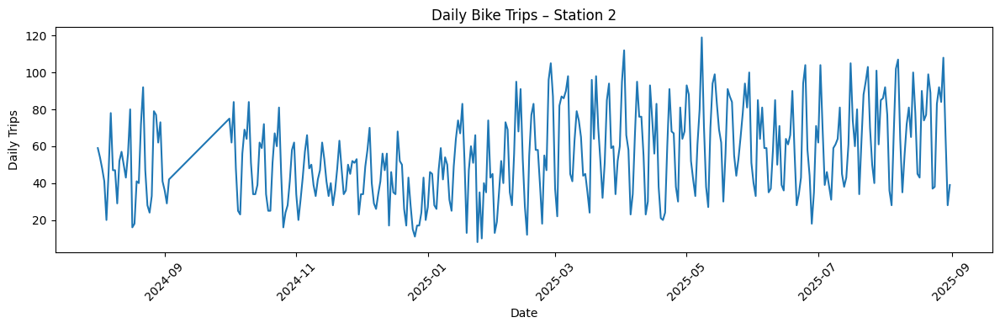

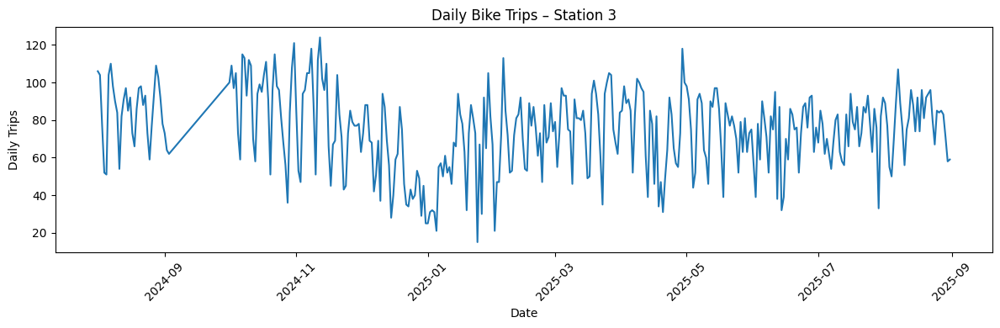

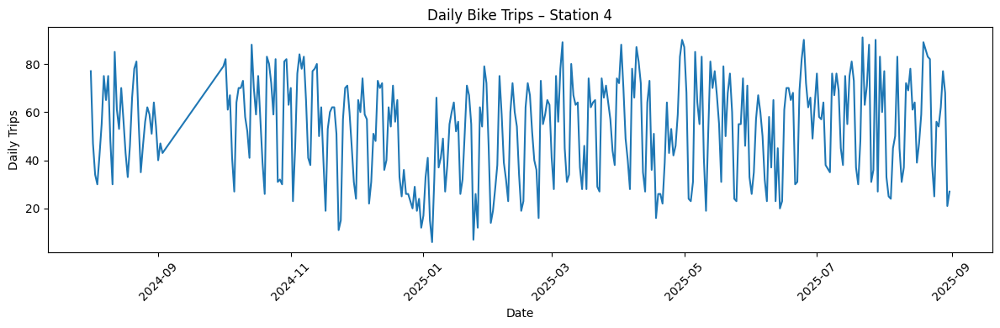

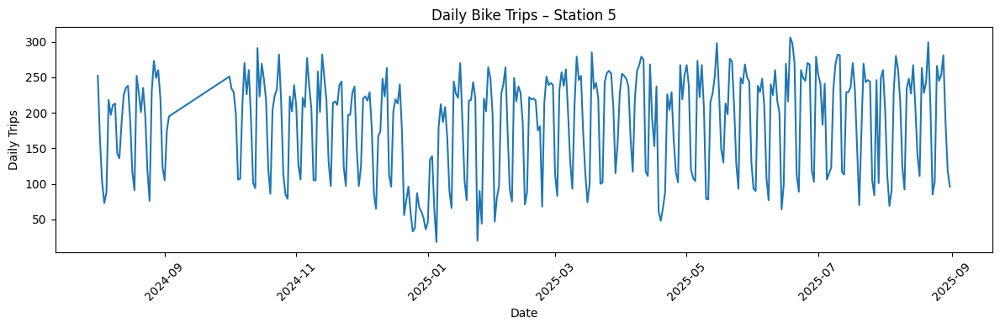

...

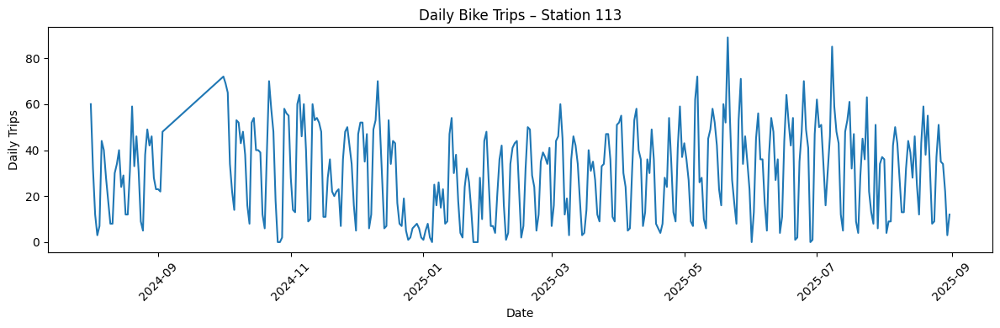

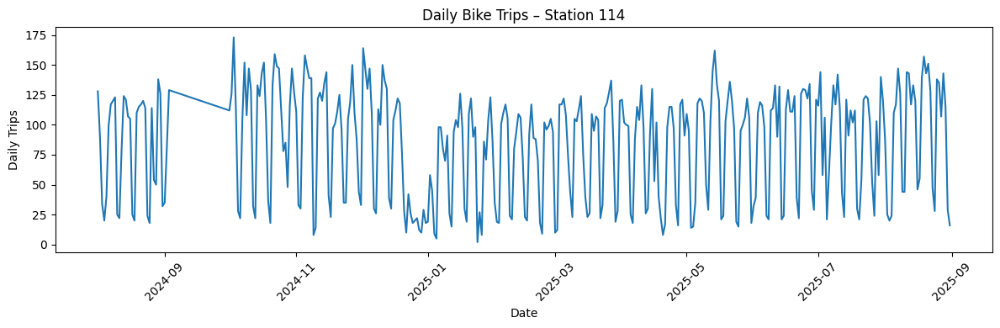

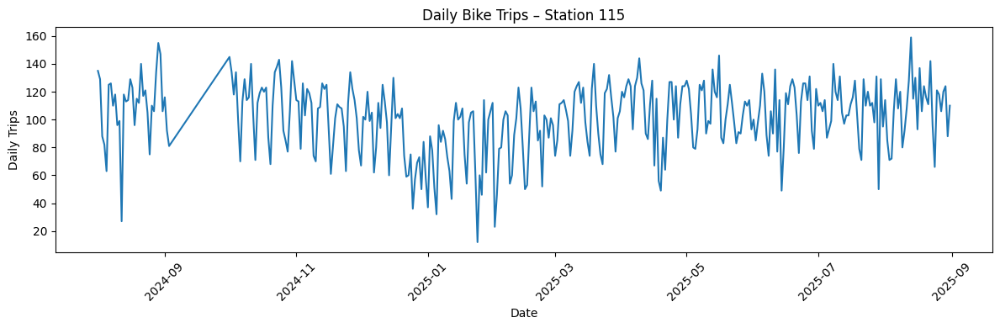

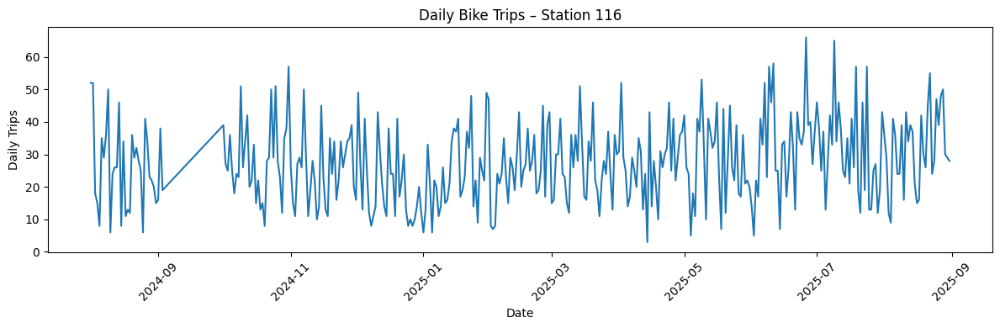

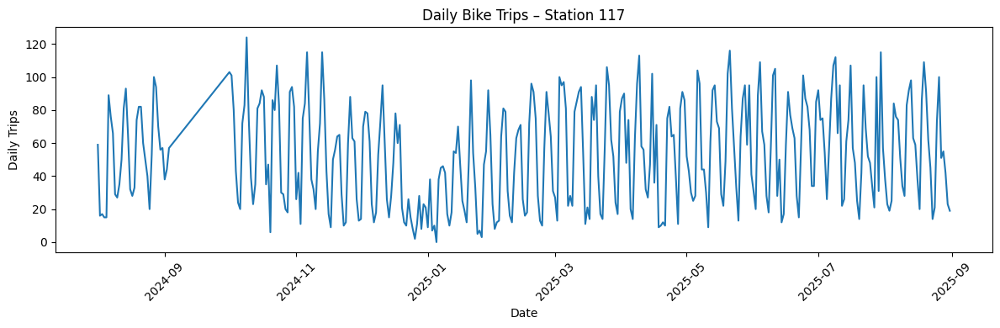

In [152]:
station_ids = station_ids = station_ids_list

for station_id in station_ids:
    plot_df = (
        daily_trips[daily_trips["station_id"] == station_id]
        .sort_values("date")
    )

    plt.figure(figsize=(12, 4))
    plt.plot(plot_df["date"], plot_df["daily_trips"])
    plt.xlabel("Date")
    plt.ylabel("Daily Trips")
    plt.title(f"Daily Bike Trips – Station {station_id}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Compare stations on THE SAME plot (useful for analysis)

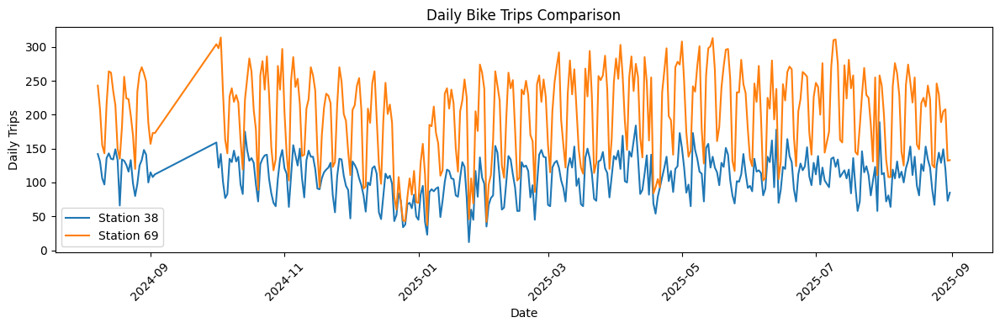

In [177]:
station_ids = [38, 69]

plt.figure(figsize=(12, 4))

for station_id in station_ids:
    plot_df = (
        daily_trips[daily_trips["station_id"] == station_id]
        .sort_values("date")
    )
    plt.plot(plot_df["date"], plot_df["daily_trips"], label=f"Station {station_id}")

plt.xlabel("Date")
plt.ylabel("Daily Trips")
plt.title("Daily Bike Trips Comparison")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [154]:
daily_trips.shape

(42069, 3)

Feature engineering (NO weather)

In [155]:
daily_trips["date"] = pd.to_datetime(daily_trips["date"])

# Calendar features
daily_trips["dayofweek"] = daily_trips["date"].dt.dayofweek
daily_trips["is_weekend"] = daily_trips["dayofweek"].isin([5, 6]).astype(int)
daily_trips["week"] = daily_trips["date"].dt.isocalendar().week.astype(int)
daily_trips["month"] = daily_trips["date"].dt.month

# Lag features
for lag in [1, 7]:
    daily_trips[f"lag_{lag}"] = (
        daily_trips.groupby("station_id")["daily_trips"].shift(lag)
    )

# Rolling mean
daily_trips["rolling_7"] = (
    daily_trips.groupby("station_id")["daily_trips"]
    .shift(1)
    .rolling(7)
    .mean()
)

# Drop NA rows from lagging
daily_trips = daily_trips.dropna()


In [156]:
daily_trips

,station_id,date,daily_trips,dayofweek,is_weekend,week,month,lag_1,lag_7,rolling_7
7,1,2024-08-08,119.0,3,0,32,8,117.0,131.0,104.428571
8,1,2024-08-09,125.0,4,0,32,8,119.0,155.0,102.714286
9,1,2024-08-10,137.0,5,1,32,8,125.0,95.0,98.428571
10,1,2024-08-11,80.0,6,1,32,8,137.0,49.0,104.428571
11,1,2024-08-12,109.0,0,0,33,8,80.0,81.0,108.857143
...,...,...,...,...,...,...,...,...,...,...
42064,117,2025-08-27,51.0,2,0,35,8,100.0,91.0,58.000000
42065,117,2025-08-28,55.0,3,0,35,8,51.0,62.0,52.285714
42066,117,2025-08-29,42.0,4,0,35,8,55.0,45.0,51.285714
42067,117,2025-08-30,23.0,5,1,35,8,42.0,14.0,50.857143


In [157]:
#df = pd.read_csv("dublinbikes_history.csv", parse_dates=["last_reported"])
df.sort_values(["station_id", "last_reported"], inplace=True)

df["bike_diff"] = df.groupby("station_id")["num_bikes_available"].diff()
df["trip_events"] = df["bike_diff"].abs()

Availability Analysis

In [158]:
df["availability_ratio"] = df["num_bikes_available"] / df["capacity"] # Measures how full a station is

Interpretation

Near 0 → Empty station (high unmet demand)

Near 1 → Full station (returns blocked)

2.2 Empty / Full Station Frequency

 computes how often each bike station is nearly empty or nearly full.

It’s a station-level reliability / stress metric, very useful for availability analysis and rebalancing decisions.

In [159]:
availability_stats = (
    df.groupby("station_id")
      .agg(
          empty_pct=("availability_ratio", lambda x: (x < 0.1).mean()),
          full_pct=("availability_ratio", lambda x: (x > 0.9).mean())
      )
      .reset_index()
)


In [160]:
availability_stats

,station_id,empty_pct,full_pct
0,1,0.163665,0.139622
1,2,0.353966,0.004938
2,3,0.128837,0.045359
3,4,0.074210,0.066589
4,5,0.136803,0.163188
...,...,...,...
110,113,0.359231,0.005310
111,114,0.416920,0.045576
112,115,0.100994,0.246668
113,116,0.341439,0.000504


Insight

High empty_pct → needs bike supply

High full_pct → needs bike removal

Usage Pattern Analysis

3.1 Hourly Usage   Reveals commuting peaks

In [161]:
df["hour"] = df["last_reported"].dt.hour

hourly_usage = (
    df.groupby(["station_id", "hour"])["trip_events"]
      .mean()
      .reset_index()
)


In [162]:
hourly_usage

,station_id,hour,trip_events
0,1,0,0.067608
1,1,1,0.000899
2,1,2,0.000864
3,1,3,0.000863
4,1,4,0.103283
...,...,...,...
2755,117,19,0.260127
2756,117,20,0.224705
2757,117,21,0.193158
2758,117,22,0.108413


Weekday vs Weekend   Identifies commuter vs leisure stations

In [163]:
df["is_weekend"] = df["last_reported"].dt.weekday >= 5

weekday_usage = (
    df.groupby(["station_id", "is_weekend"])["trip_events"]
      .mean()
      .reset_index()
)


In [164]:
weekday_usage

,station_id,is_weekend,trip_events
0,1,False,0.581628
1,1,True,0.496069
2,2,False,0.373076
3,2,True,0.213880
4,3,False,0.446721
...,...,...,...
225,115,True,0.445096
226,116,False,0.193444
227,116,True,0.129654
228,117,False,0.385561


Daily Demand & Utilization

Interpretation

Utilization > 1 → multiple turnovers per bike

Very low utilization → underused station

In [165]:
df["date"] = df["last_reported"].dt.date

daily_stats = (
    df.groupby(["station_id", "date"])
      .agg(
          daily_trips=("trip_events", "sum"),
          avg_availability=("availability_ratio", "mean"),
          capacity=("capacity", "max")
      )
      .reset_index()
)

daily_stats["utilization_rate"] = daily_stats["daily_trips"] / daily_stats["capacity"]


In [166]:
daily_stats

,station_id,date,daily_trips,avg_availability,capacity,utilization_rate
0,1,2024-08-01,131.0,0.532098,31,4.225806
1,1,2024-08-02,155.0,0.627135,31,5.000000
2,1,2024-08-03,95.0,0.772345,31,3.064516
3,1,2024-08-04,49.0,0.948494,31,1.580645
4,1,2024-08-05,81.0,0.774558,31,2.612903
...,...,...,...,...,...,...
42064,117,2025-08-27,51.0,0.056555,40,1.275000
42065,117,2025-08-28,55.0,0.065179,40,1.375000
42066,117,2025-08-29,42.0,0.112037,40,1.050000
42067,117,2025-08-30,23.0,0.087258,40,0.575000


Station Behavior Profiling

Aggregate station-level behavior:

In [167]:
station_profile = (
    daily_stats.groupby("station_id")
    .agg(
        mean_daily_trips=("daily_trips", "mean"),
        trip_variability=("daily_trips", "std"),
        mean_utilization=("utilization_rate", "mean"),
        empty_rate=("avg_availability", lambda x: (x < 0.1).mean()),
        full_rate=("avg_availability", lambda x: (x > 0.9).mean())
    )
    .reset_index()
)


In [168]:
station_profile

,station_id,mean_daily_trips,trip_variability,mean_utilization,empty_rate,full_rate
0,1,106.277174,27.209538,3.428296,0.002717,0.005435
1,2,55.179348,23.511500,2.758967,0.163043,0.000000
2,3,74.698370,21.186953,3.734918,0.013587,0.016304
3,4,53.198370,20.272296,2.659918,0.005435,0.010870
4,5,185.502717,71.191724,4.637568,0.016304,0.002717
...,...,...,...,...,...,...
110,113,30.407609,19.447607,0.760190,0.285326,0.002717
111,114,84.570652,45.307432,2.114266,0.198370,0.002717
112,115,101.592391,24.689288,3.386413,0.000000,0.019022
113,116,27.434783,12.445679,0.914493,0.285326,0.000000


Clustering Stations by Usage Pattern

What the clusters mean (example)

After clustering, you might get:

| Cluster | Interpretation                         |
| ------- | -------------------------------------- |
| 0       | High-demand commuter hubs              |
| 1       | Low-usage residential stations         |
| 2       | Imbalanced stations (often empty/full) |
| 3       | Stable, moderate-usage stations        |


In [169]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

features = [
    "mean_daily_trips",
    "trip_variability",
    "mean_utilization",
    "empty_rate",
    "full_rate"
]

X = station_profile[features]
X_scaled = StandardScaler().fit_transform(X)

kmeans = KMeans(n_clusters=4, random_state=42)
station_profile["cluster"] = kmeans.fit_predict(X_scaled)


In [170]:
station_profile

,station_id,mean_daily_trips,trip_variability,mean_utilization,empty_rate,full_rate,cluster
0,1,106.277174,27.209538,3.428296,0.002717,0.005435,2
1,2,55.179348,23.511500,2.758967,0.163043,0.000000,0
2,3,74.698370,21.186953,3.734918,0.013587,0.016304,2
3,4,53.198370,20.272296,2.659918,0.005435,0.010870,0
4,5,185.502717,71.191724,4.637568,0.016304,0.002717,1
...,...,...,...,...,...,...,...
110,113,30.407609,19.447607,0.760190,0.285326,0.002717,0
111,114,84.570652,45.307432,2.114266,0.198370,0.002717,0
112,115,101.592391,24.689288,3.386413,0.000000,0.019022,2
113,116,27.434783,12.445679,0.914493,0.285326,0.000000,3


Rebalancing Insights

Identify Critical Stations

Prioritize for truck-based rebalancing

In [171]:
critical_stations = station_profile[
    (station_profile["empty_rate"] > 0.25) |
    (station_profile["full_rate"] > 0.25)
]


In [172]:
critical_stations

,station_id,mean_daily_trips,trip_variability,mean_utilization,empty_rate,full_rate,cluster
6,7,46.752717,17.428288,1.612163,0.285326,0.005435,0
12,13,36.853261,19.764835,1.228442,0.279891,0.002717,0
14,15,38.513587,14.282660,2.407099,0.293478,0.000000,0
29,30,27.184783,11.165517,1.359239,0.592391,0.000000,3
36,37,32.448370,15.313884,1.081612,0.274457,0.005435,0
45,47,44.687500,26.357274,1.117188,0.410326,0.002717,3
49,51,4.070652,13.372892,0.101766,0.929348,0.000000,3
53,55,44.785326,28.284370,1.244037,0.293478,0.000000,0
57,59,34.801630,15.880559,1.740082,0.532609,0.000000,3
59,61,23.864130,14.681283,0.954565,0.741848,0.000000,3
